## 1. Importing the essential libraries and inspecting the dataset

#### 1.1 Importing the libraries

In [1]:
# Data preprocessing libraries
import numpy as np
import pandas as pd
from pandas.plotting import parallel_coordinates

import os
import sqlite3
import math
from collections import Counter
from pathlib import Path
from tqdm import tqdm

# Visualization
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
import plotly
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.io as pio

# Model
from scipy.stats import skew
!pip install yellowbrick
import sklearn
from sklearn.decomposition import PCA 
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE 
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.metrics import roc_auc_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.preprocessing import OrdinalEncoder, OneHotEncoder
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV

# Config
mpl.rcParams['font.family'] = 'monospace' 
sns.set_theme(style="white", palette=None)
plotly.offline.init_notebook_mode() 
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300

In [44]:
# Config
mpl.rcParams['font.family'] = 'monospace' 
sns.set_theme(style="white", palette=None)
plotly.offline.init_notebook_mode() 
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300

In [130]:

df_test = pd.read_csv(r"fraudTest.csv")
df_test.drop(df_test.columns[0], axis=1, inplace=True)

In [3]:
%matplotlib inline

#### 1.2 Importing the dataset and creating some addtional columns

In [3]:
# Reading csv files and drop the first column
df_train = pd.read_csv(r"fraudTrain.csv")
df_train.drop(df_train.columns[0], axis=1, inplace=True)

df_test = pd.read_csv(r"fraudTest.csv")
df_test.drop(df_test.columns[0], axis=1, inplace=True)

# First view 10 rows
df_train.head(10)

,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,...,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud
0,2019-01-01 00:00:18,2703186189652095,"fraud_Rippin, Kub and Mann",misc_net,4.97,Jennifer,Banks,F,561 Perry Cove,Moravian Falls,...,36.0788,-81.1781,3495,"Psychologist, counselling",1988-03-09,0b242abb623afc578575680df30655b9,1325376018,36.011293,-82.048315,0
1,2019-01-01 00:00:44,630423337322,"fraud_Heller, Gutmann and Zieme",grocery_pos,107.23,Stephanie,Gill,F,43039 Riley Greens Suite 393,Orient,...,48.8878,-118.2105,149,Special educational needs teacher,1978-06-21,1f76529f8574734946361c461b024d99,1325376044,49.159047,-118.186462,0
2,2019-01-01 00:00:51,38859492057661,fraud_Lind-Buckridge,entertainment,220.11,Edward,Sanchez,M,594 White Dale Suite 530,Malad City,...,42.1808,-112.2620,4154,Nature conservation officer,1962-01-19,a1a22d70485983eac12b5b88dad1cf95,1325376051,43.150704,-112.154481,0
3,2019-01-01 00:01:16,3534093764340240,"fraud_Kutch, Hermiston and Farrell",gas_transport,45.00,Jeremy,White,M,9443 Cynthia Court Apt. 038,Boulder,...,46.2306,-112.1138,1939,Patent attorney,1967-01-12,6b849c168bdad6f867558c3793159a81,1325376076,47.034331,-112.561071,0
4,2019-01-01 00:03:06,375534208663984,fraud_Keeling-Crist,misc_pos,41.96,Tyler,Garcia,M,408 Bradley Rest,Doe Hill,...,38.4207,-79.4629,99,Dance movement psychotherapist,1986-03-28,a41d7549acf90789359a9aa5346dcb46,1325376186,38.674999,-78.632459,0
5,2019-01-01 00:04:08,4767265376804500,"fraud_Stroman, Hudson and Erdman",gas_transport,94.63,Jennifer,Conner,F,4655 David Island,Dublin,...,40.3750,-75.2045,2158,Transport planner,1961-06-19,189a841a0a8ba03058526bcfe566aab5,1325376248,40.653382,-76.152667,0
6,2019-01-01 00:04:42,30074693890476,fraud_Rowe-Vandervort,grocery_net,44.54,Kelsey,Richards,F,889 Sarah Station Suite 624,Holcomb,...,37.9931,-100.9893,2691,Arboriculturist,1993-08-16,83ec1cc84142af6e2acf10c44949e720,1325376282,37.162705,-100.153370,0
7,2019-01-01 00:05:08,6011360759745864,fraud_Corwin-Collins,gas_transport,71.65,Steven,Williams,M,231 Flores Pass Suite 720,Edinburg,...,38.8432,-78.6003,6018,"Designer, multimedia",1947-08-21,6d294ed2cc447d2c71c7171a3d54967c,1325376308,38.948089,-78.540296,0
8,2019-01-01 00:05:18,4922710831011201,fraud_Herzog Ltd,misc_pos,4.27,Heather,Chase,F,6888 Hicks Stream Suite 954,Manor,...,40.3359,-79.6607,1472,Public affairs consultant,1941-03-07,fc28024ce480f8ef21a32d64c93a29f5,1325376318,40.351813,-79.958146,0
9,2019-01-01 00:06:01,2720830304681674,"fraud_Schoen, Kuphal and Nitzsche",grocery_pos,198.39,Melissa,Aguilar,F,21326 Taylor Squares Suite 708,Clarksville,...,36.5220,-87.3490,151785,Pathologist,1974-03-28,3b9014ea8fb80bd65de0b1463b00b00e,1325376361,37.179198,-87.485381,0


In [ ]:
df_train.rename(columns={"trans_date_trans_time":"transaction_time",
                         "cc_num":"credit_card_number",
                         "amt":"amount(usd)",
                         "trans_num":"transaction_id"},
                inplace=True)

In [ ]:
df_test.rename(columns={"trans_date_trans_time":"transaction_time",
                         "cc_num":"credit_card_number",
                         "amt":"amount(usd)",
                         "trans_num":"transaction_id"},
                inplace=True)

> **Rename some columns**

> **Convert datetime columns**   
*transaction_time* and *dob* should be in pd.datetime format and we also convert unix_time to exact timestamp

In [5]:
df_train["transaction_time"] = pd.to_datetime(df_train["transaction_time"], infer_datetime_format=True)
df_train["dob"] = pd.to_datetime(df_train["dob"], infer_datetime_format=True)

C:\Users\fahad\AppData\Local\Temp\ipykernel_33928\3315407144.py:1: UserWarning:

The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.

C:\Users\fahad\AppData\Local\Temp\ipykernel_33928\3315407144.py:2: UserWarning:

The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.



In [6]:
from datetime import datetime

# Apply function utcfromtimestamp and drop column unix_time
df_train['time'] = df_train['unix_time'].apply(datetime.utcfromtimestamp)
df_train.drop('unix_time', axis=1)

# Add cloumn hour of day
df_train['hour_of_day'] = df_train.time.dt.hour

In [7]:
df_train[['time','hour_of_day']]

,time,hour_of_day
0,2012-01-01 00:00:18,0
1,2012-01-01 00:00:44,0
2,2012-01-01 00:00:51,0
3,2012-01-01 00:01:16,0
4,2012-01-01 00:03:06,0
...,...,...
1296670,2013-06-21 12:12:08,12
1296671,2013-06-21 12:12:19,12
1296672,2013-06-21 12:12:32,12
1296673,2013-06-21 12:13:36,12


> **Convert dtypes**   
Credit card number should be integer, let's change.

In [8]:
# Change dtypes
df_train.credit_card_number = df_train.credit_card_number.astype('category')
df_train.is_fraud = df_train.is_fraud.astype('category')
df_train.hour_of_day = df_train.hour_of_day.astype('category')

# Check
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1296675 entries, 0 to 1296674
Data columns (total 24 columns):
 #   Column              Non-Null Count    Dtype         
---  ------              --------------    -----         
 0   transaction_time    1296675 non-null  datetime64[ns]
 1   credit_card_number  1296675 non-null  category      
 2   merchant            1296675 non-null  object        
 3   category            1296675 non-null  object        
 4   amount(usd)         1296675 non-null  float64       
 5   first               1296675 non-null  object        
 6   last                1296675 non-null  object        
 7   gender              1296675 non-null  object        
 8   street              1296675 non-null  object        
 9   city                1296675 non-null  object        
 10  state               1296675 non-null  object        
 11  zip                 1296675 non-null  int64         
 12  lat                 1296675 non-null  float64       
 13  long        

## 2. Exploratory Data Analysis

#### 2.1 Descriptive Statistics of the dataset

In [11]:
df_train.columns

Index(['transaction_time', 'credit_card_number', 'merchant', 'category',
       'amount(usd)', 'first', 'last', 'gender', 'street', 'city', 'state',
       'zip', 'lat', 'long', 'city_pop', 'job', 'dob', 'transaction_id',
       'unix_time', 'merch_lat', 'merch_long', 'is_fraud', 'time',
       'hour_of_day'],
      dtype='object')

In [21]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1296675 entries, 0 to 1296674
Data columns (total 24 columns):
 #   Column              Non-Null Count    Dtype         
---  ------              --------------    -----         
 0   transaction_time    1296675 non-null  datetime64[ns]
 1   credit_card_number  1296675 non-null  category      
 2   merchant            1296675 non-null  object        
 3   category            1296675 non-null  object        
 4   amount(usd)         1296675 non-null  float64       
 5   first               1296675 non-null  object        
 6   last                1296675 non-null  object        
 7   gender              1296675 non-null  object        
 8   street              1296675 non-null  object        
 9   city                1296675 non-null  object        
 10  state               1296675 non-null  object        
 11  zip                 1296675 non-null  int64         
 12  lat                 1296675 non-null  float64       
 13  long        

In [27]:
df_train['age'] = (pd.to_datetime(df_train['transaction_time']).dt.year - pd.to_datetime(df_train['dob']).dt.year)


In [28]:

# Assuming df_train is already loaded

# Separate the data into fraud and non-fraud subsets
fraud_data = df_train[df_train['is_fraud'] == 1]
non_fraud_data = df_train[df_train['is_fraud'] == 0]

# Descriptive statistics for fraud data
print("Descriptive Statistics for Fraud Data (Numerical):")
fraud_data[['amount(usd)','age']].describe()



Descriptive Statistics for Fraud Data (Numerical):


,amount(usd),age
count,7506.000000,7506.000000
mean,531.320092,48.866240
std,390.560070,18.856058
min,1.060000,14.000000
25%,245.662500,33.000000
50%,396.505000,48.000000
75%,900.875000,61.000000
max,1376.040000,94.000000


In [29]:
# Descriptive statistics for non-fraud data
print("Descriptive Statistics for Non-Fraud Data (Numerical):")
non_fraud_data[['amount(usd)','age']].describe()

Descriptive Statistics for Non-Fraud Data (Numerical):


,amount(usd),age
count,1.289169e+06,1.289169e+06
mean,6.766711e+01,4.601278e+01
std,1.540080e+02,1.737208e+01
min,1.000000e+00,1.400000e+01
25%,9.610000e+00,3.300000e+01
50%,4.728000e+01,4.400000e+01
75%,8.254000e+01,5.700000e+01
max,2.894890e+04,9.600000e+01


In [23]:
# Checking for missing values
print("Missing Values:")
print(df_train.isnull().sum(), "\n")


Missing Values:
transaction_time      0
credit_card_number    0
merchant              0
category              0
amount(usd)           0
first                 0
last                  0
gender                0
street                0
city                  0
state                 0
zip                   0
lat                   0
long                  0
city_pop              0
job                   0
dob                   0
transaction_id        0
unix_time             0
merch_lat             0
merch_long            0
is_fraud              0
time                  0
hour_of_day           0
dtype: int64 



#### 2.2 EDA on Fraud vs Genuine Tranactions

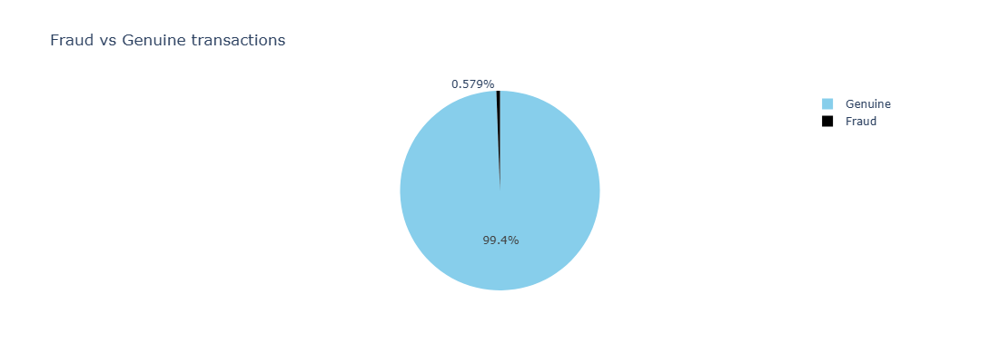

In [25]:
labels=["Genuine","Fraud"]

fraud_or_not = df_train["is_fraud"].value_counts().tolist()
values = [fraud_or_not[0], fraud_or_not[1]]

fig = px.pie(values=df_train['is_fraud'].value_counts(), names=labels , width=700, height=400, color_discrete_sequence=["skyblue","black"]
             ,title="Fraud vs Genuine transactions")
fig.show()

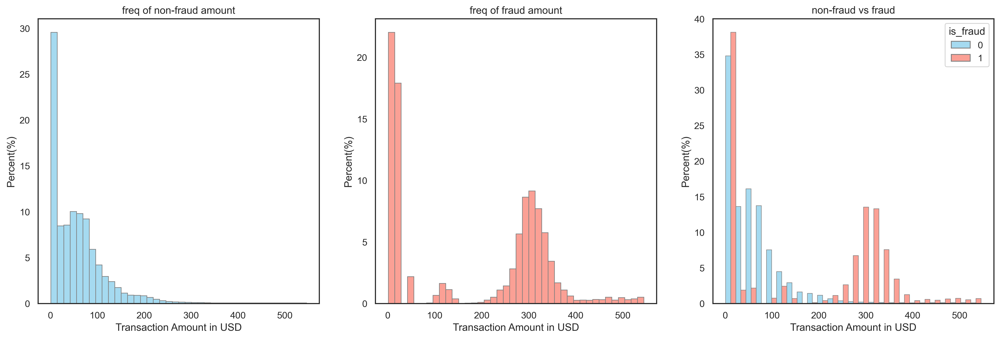

In [36]:
p99 = df_train["amount(usd)"].quantile(0.99)
fig, ax = plt.subplots(1, 3, figsize=(20, 6))
sns.histplot(x='amount(usd)', data=df_train[(df_train['is_fraud'] == 0) & (df_train['amount(usd)'] <= p99)], stat='percent', bins=40, ax=ax[0], color='skyblue', edgecolor='grey')
ax[0].set_title('freq of non-fraud amount')
ax[0].set_xlabel('Transaction Amount in USD')
ax[0].set_ylabel('Percent(%)')
sns.histplot(x='amount(usd)', data=df_train[(df_train['is_fraud'] == 1) & (df_train['amount(usd)'] <= p99)], stat='percent', bins=40, ax=ax[1], color='salmon', edgecolor='grey')
ax[1].set_title('freq of fraud amount')
ax[1].set_xlabel('Transaction Amount in USD')
ax[1].set_ylabel('Percent(%)')
sns.histplot(x='amount(usd)', data=df_train[df_train["amount(usd)"] <= p99], hue='is_fraud', stat='percent', multiple='dodge', common_norm=False, bins=25, ax=ax[2], palette={0: 'skyblue', 1: 'salmon'}, edgecolor='grey')
ax[2].set_title('non-fraud vs fraud')
ax[2].set_xlabel('Transaction Amount in USD')
ax[2].set_ylabel('Percent(%)')
plt.show()

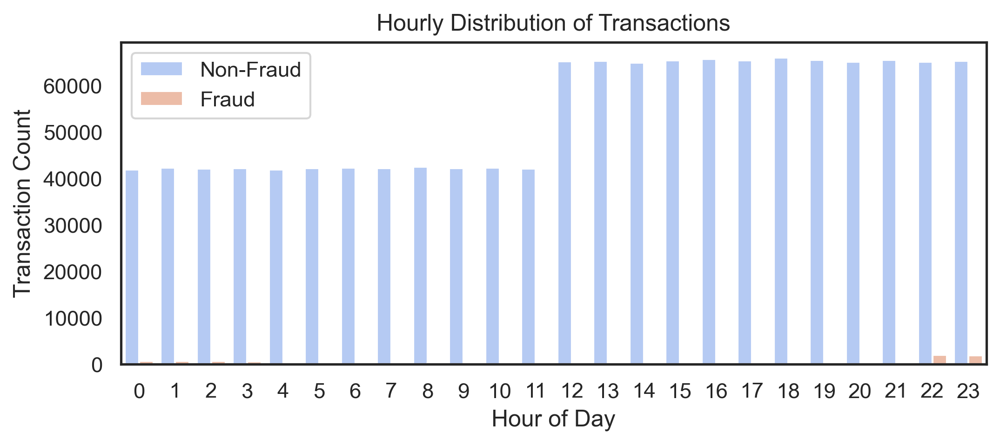

In [45]:
# Compare hourly distribution of transactions
plt.figure(figsize=(8, 3))
sns.countplot(data=df_train, x='hour_of_day', hue='is_fraud', palette='coolwarm')
plt.title('Hourly Distribution of Transactions')
plt.xlabel('Hour of Day')
plt.ylabel('Transaction Count')
plt.legend(['Non-Fraud', 'Fraud'])
plt.show()

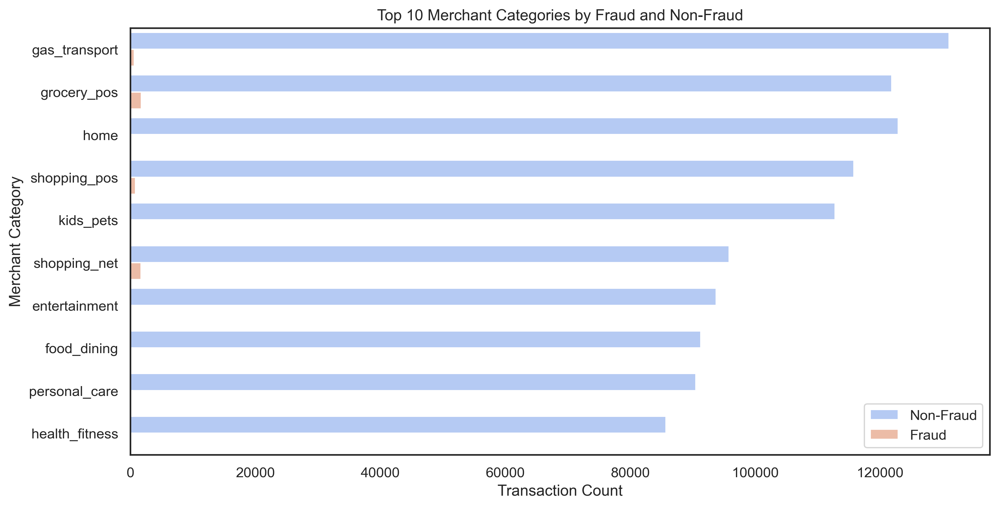

In [46]:
# Analyze merchant categories
top_categories = df_train['category'].value_counts().head(10).index
filtered_data = df_train[df_train['category'].isin(top_categories)]
plt.figure(figsize=(12, 6))
sns.countplot(data=filtered_data, y='category', hue='is_fraud', palette='coolwarm', order=top_categories)
plt.title('Top 10 Merchant Categories by Fraud and Non-Fraud')
plt.xlabel('Transaction Count')
plt.ylabel('Merchant Category')
plt.legend(['Non-Fraud', 'Fraud'])
plt.show()


C:\Users\fahad\AppData\Local\Temp\ipykernel_33928\2646094081.py:2: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.


C:\Users\fahad\AppData\Local\Temp\ipykernel_33928\2646094081.py:3: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.




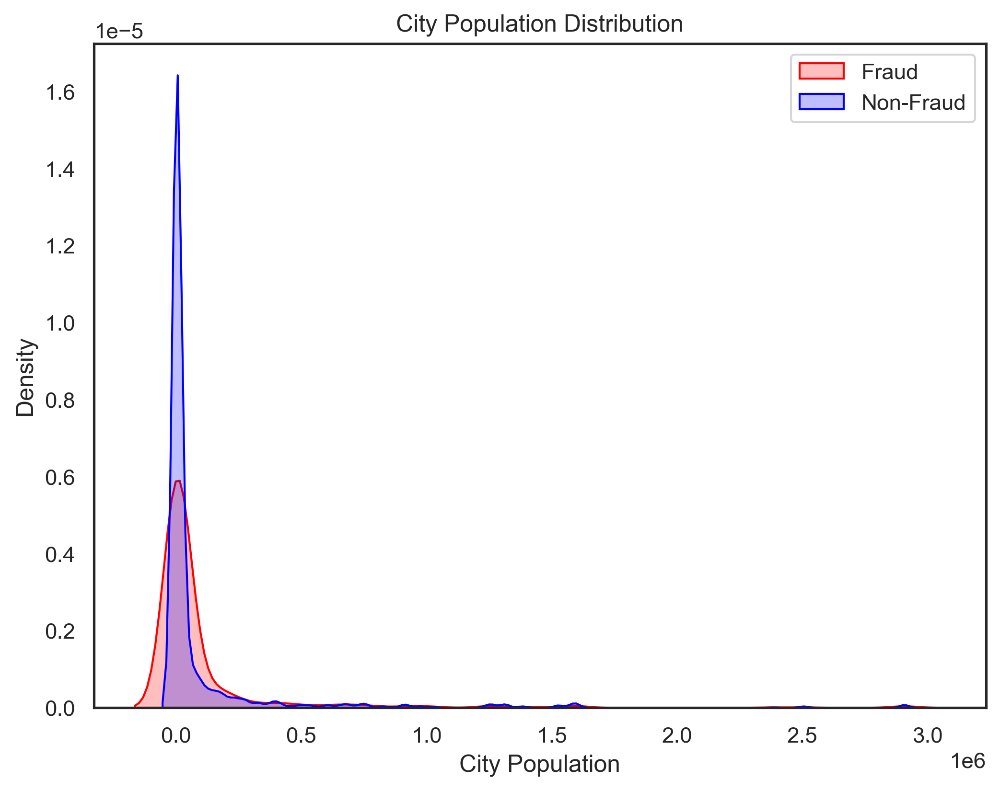

In [47]:
plt.figure(figsize=(8, 6))
sns.kdeplot(fraud_data['city_pop'], shade=True, color='red', label='Fraud')
sns.kdeplot(non_fraud_data['city_pop'], shade=True, color='blue', label='Non-Fraud')
plt.title('City Population Distribution')
plt.xlabel('City Population')
plt.ylabel('Density')
plt.legend()
plt.show()

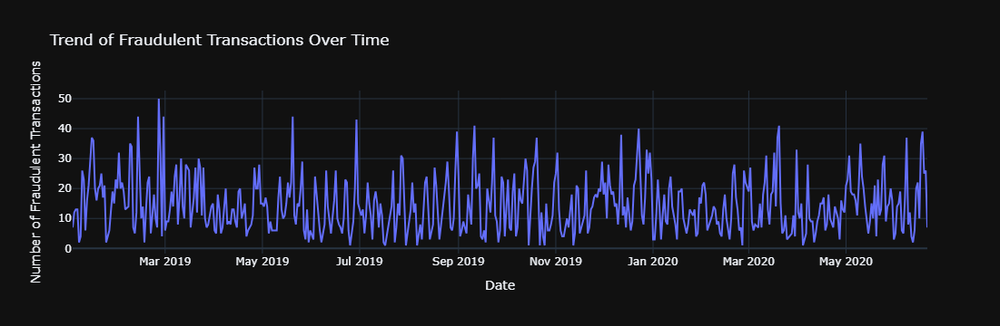

In [93]:
fraud_trend = fraud_data.groupby(fraud_data['transaction_time'].dt.date).size().reset_index(name='fraud_count')

# Rename columns for clarity
fraud_trend.rename(columns={'transaction_time': 'date'}, inplace=True)

# Create the line chart using Plotly
fig = px.line(
    fraud_trend,
    x='date',
    y='fraud_count',
    title='Trend of Fraudulent Transactions Over Time',
    labels={'date': 'Date', 'fraud_count': 'Number of Fraudulent Transactions'},
    template='plotly_dark'
)

# Customize the chart
fig.update_layout(
    xaxis_title='Date',
    yaxis_title='Number of Fraudulent Transactions',
    hovermode='x unified'
)

# Show the chart
fig.show()

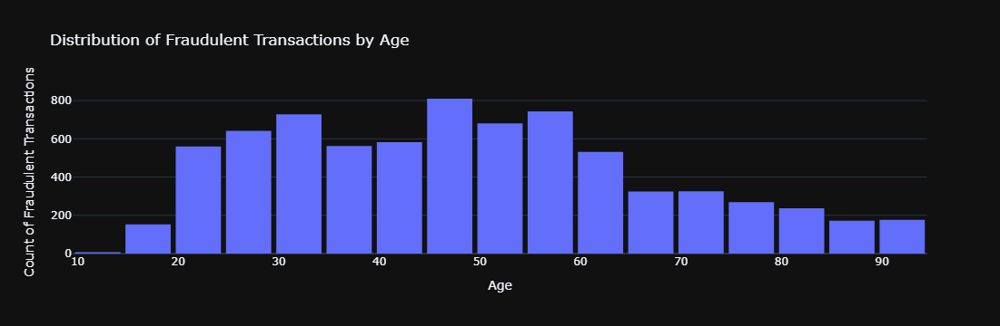

In [94]:
# Plot the age distribution for fraud transactions
fig = px.histogram(
    fraud_data,
    x='age',
    nbins=30,
    title='Distribution of Fraudulent Transactions by Age',
    labels={'age': 'Age'},
    template='plotly_dark'
)

# Customize the chart
fig.update_layout(
    xaxis_title='Age',
    yaxis_title='Count of Fraudulent Transactions',
    bargap=0.1
)

# Show the chart
fig.show()

In [ ]:
import plotly.express as px

# Aggregate data to count fraud and non-fraud transactions at unique lat/long points
agg_data = df_train.groupby(['lat', 'long', 'is_fraud']).size().reset_index(name='count')

# Create a scatter map using Plotly
fig = px.scatter_mapbox(
    agg_data,
    lat='lat',
    lon='long',
    size='count',  # Bubble size based on transaction count
    color='is_fraud',  # Differentiate fraud (1) and non-fraud (0)
    labels={'is_fraud': 'Fraudulent Transaction'},
    title='Fraud vs Non-Fraud Transactions by Latitude and Longitude',
    hover_data={'count': True, 'lat': True, 'long': True},
    color_discrete_map={0: 'blue', 1: 'red'},  # Map non-fraud (blue) and fraud (red)
    mapbox_style='carto-positron',  # Base map style
    zoom=3,  # Initial zoom level
    height=600,  # Height of the plot
    width=1000  # Width of the plot
)

# Show the map
fig.show()


C:\Users\fahad\AppData\Local\Temp\ipykernel_33928\2545020202.py:4: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



#### 2.3 Visualising the dataset

In [16]:
np.round(df_train.describe(), 2)

,transaction_time,amount(usd),zip,lat,long,city_pop,dob,unix_time,merch_lat,merch_long,time
count,1296675,1296675.00,1296675.00,1296675.00,1296675.00,1296675.00,1296675,1.296675e+06,1296675.00,1296675.00,1296675
mean,2019-10-03 12:47:28.070214144,70.35,48800.67,38.54,-90.23,88824.44,1973-10-03 19:02:55.017178512,1.349244e+09,38.54,-90.23,2012-10-03 05:53:56.726123008
min,2019-01-01 00:00:18,1.00,1257.00,20.03,-165.67,23.00,1924-10-30 00:00:00,1.325376e+09,19.03,-166.67,2012-01-01 00:00:18
25%,2019-06-03 19:12:22.500000,9.65,26237.00,34.62,-96.80,743.00,1962-08-13 00:00:00,1.338751e+09,34.73,-96.90,2012-06-03 19:12:22.500000
50%,2019-10-03 07:35:47,47.52,48174.00,39.35,-87.48,2456.00,1975-11-30 00:00:00,1.349250e+09,39.37,-87.44,2012-10-03 07:35:47
75%,2020-01-28 15:02:55.500000,83.14,72042.00,41.94,-80.16,20328.00,1987-02-22 00:00:00,1.359385e+09,41.96,-80.24,2013-01-28 15:02:55.500000
max,2020-06-21 12:13:37,28948.90,99783.00,66.69,-67.95,2906700.00,2005-01-29 00:00:00,1.371817e+09,67.51,-66.95,2013-06-21 12:13:37
std,NaN,160.32,26893.22,5.08,13.76,301956.36,NaN,1.284128e+07,5.11,13.77,NaN


> Quick Summarize using pandas_profiling

In [17]:
groups = [pd.Grouper(key="transaction_time", freq="1W"), "is_fraud"]
df_ = df_train.groupby(by=groups).agg({"amount(usd)":'mean',"transaction_id":"count"}).reset_index()

C:\Users\fahad\AppData\Local\Temp\ipykernel_21760\2171018192.py:2: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



In [18]:
def add_traces(df, x, y,hue, mode, cmap, showlegend=None):
    name_map = {1:"Yes", 0:"No"}
    traces = []
    for flag in df[hue].unique():
        traces.append(
            go.Scatter(
                x=df[df[hue]==flag][x],
                y=df[df[hue]==flag][y],
                mode=mode,
                marker=dict(color=cmap[flag]),
                showlegend=showlegend,
                name=name_map[flag]
            )
        )
    return traces

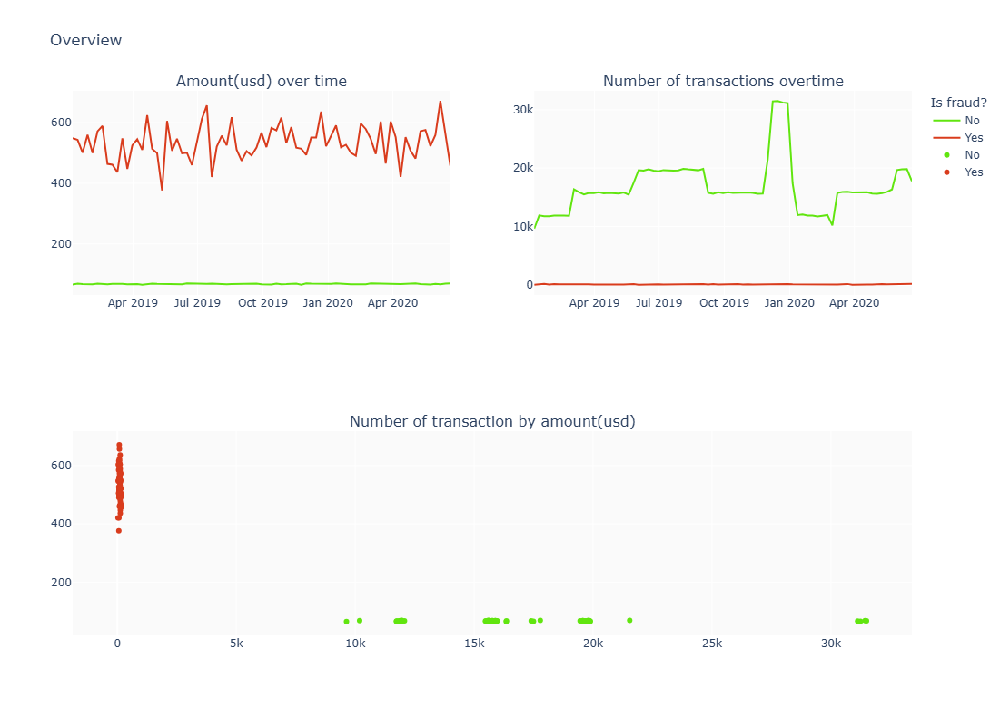

In [19]:
fig = make_subplots(rows=2, cols=2,
                    specs=[
                        [{}, {}],
                        [{"colspan":2}, None]
                    ],
                    subplot_titles=("Amount(usd) over time", "Number of transactions overtime",
                                    "Number of transaction by amount(usd)")
                   )

ntraces = add_traces(df=df_,x='transaction_time',y='amount(usd)',hue='is_fraud',mode='lines',
                    showlegend=True, cmap=['#61E50F','#D93C1D'])

for trace in ntraces:
    fig.add_trace(
        trace,
        row=1,col=1
    )
    
ntraces = add_traces(df=df_,x='transaction_time',y='transaction_id',hue='is_fraud',mode='lines',
                    showlegend=False, cmap=['#61E50F','#D93C1D'])
for trace in ntraces:
    fig.add_trace(
        trace,
        row=1,col=2
    )

ntraces = add_traces(df=df_,x='transaction_id',y='amount(usd)',hue='is_fraud',mode='markers',
                    showlegend=True, cmap=['#61E50F','#D93C1D'])
for trace in ntraces:
    fig.add_trace(
        trace,
        row=2,col=1
    )

fig.update_layout(height=780,
                  width=960,
                  legend=dict(title='Is fraud?'),
                  plot_bgcolor='#fafafa',
                  title='Overview'
                 )

fig.show()

C:\Users\fahad\AppData\Local\Temp\ipykernel_21760\4025843437.py:1: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



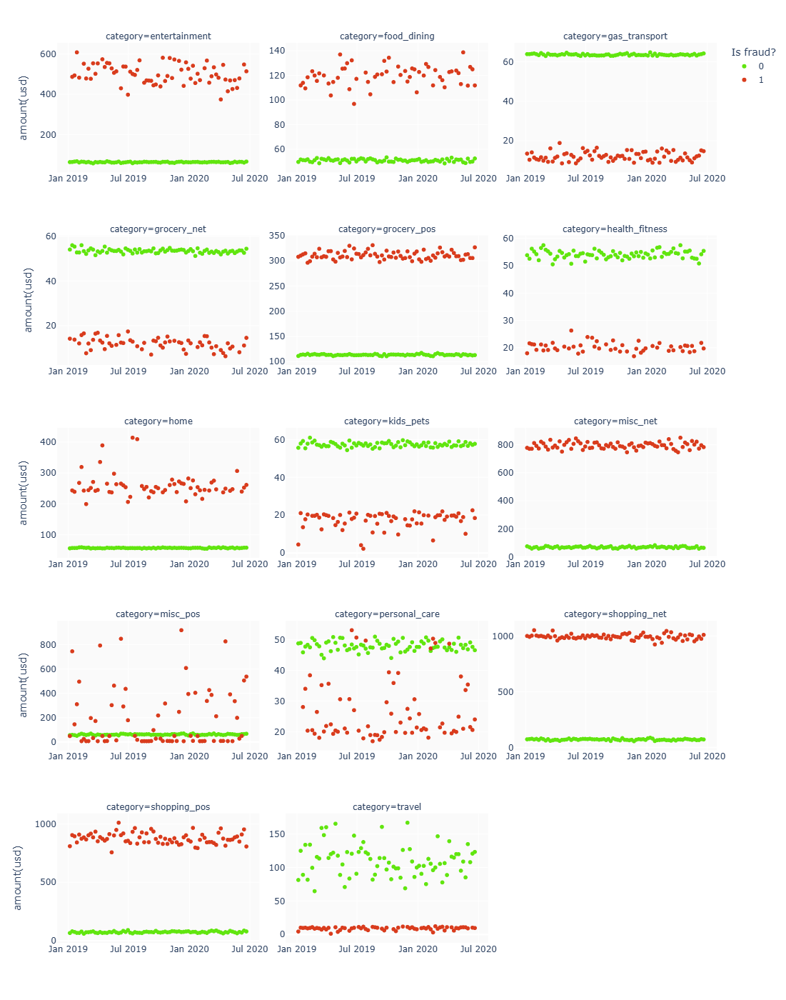

In [20]:
df_ = df_train.groupby(by=[pd.Grouper(key="transaction_time", freq="1W"),
                           'is_fraud','category']).agg({"amount(usd)":'mean',"transaction_id":"count"}).reset_index()

fig = px.scatter(df_,
        x='transaction_time',
        y='amount(usd)',
        color='is_fraud',
        facet_col ='category',
        facet_col_wrap=3,
        facet_col_spacing=.04,
        color_discrete_map={0:'#61E50F', 1:'#D93C1D'}
)

fig.update_layout(height=1400,
                  width=960,
                  legend=dict(title='Is fraud?'),
                  plot_bgcolor='#fafafa'
                 )

fig.update_yaxes(matches=None)
fig.for_each_yaxis(lambda yaxis: yaxis.update(showticklabels=True))
fig.for_each_xaxis(lambda xaxis: xaxis.update(showticklabels=True, title=''))

fig.show();

C:\Users\fahad\AppData\Local\Temp\ipykernel_21760\528473449.py:1: FutureWarning:

'M' is deprecated and will be removed in a future version, please use 'ME' instead.

C:\Users\fahad\AppData\Local\Temp\ipykernel_21760\528473449.py:1: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



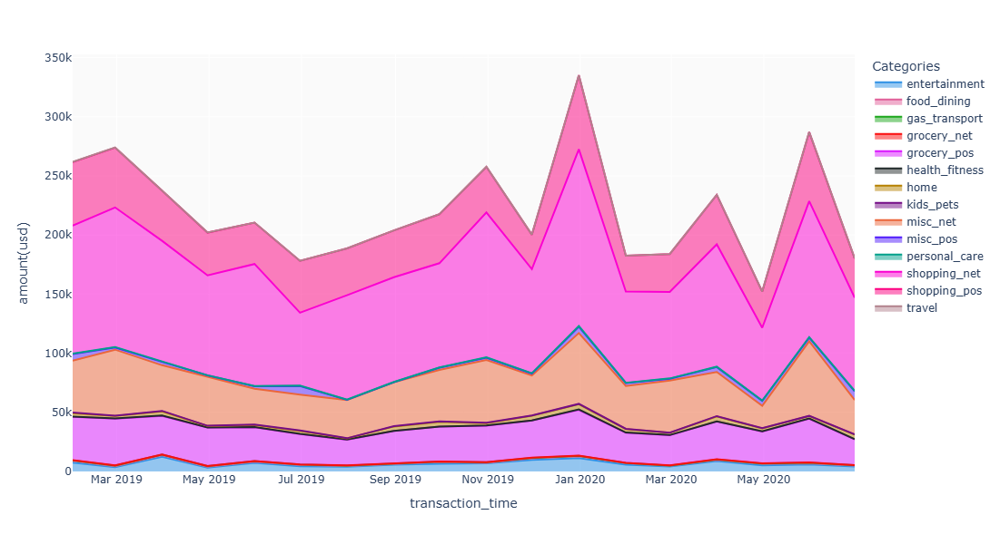

In [21]:
df_ = df_train.groupby(by=[pd.Grouper(key="transaction_time", freq="1M"),
                           'is_fraud','category']).agg({"amount(usd)":'sum',"transaction_id":"count"}).reset_index()

fig = px.area(
    df_[df_.is_fraud==1],
    x='transaction_time',
    y='amount(usd)',
    color='category',
    color_discrete_sequence=px.colors.qualitative.Dark24
)

fig.update_layout(height=600,
                  width=960,
                  legend=dict(title='Categories'),
                  plot_bgcolor='#fafafa'
                 )

fig.show();

In [22]:
# Specified list of 12 merchants with the highest number of transactions.
top12_merchants = df_train.merchant.value_counts()[:12]

df_ = df_train.groupby(by=[pd.Grouper(key="transaction_time", freq="1W"),'is_fraud',
                           'merchant']).agg({"amount(usd)":'mean',"transaction_id":"count"}).reset_index()

df_ = df_[df_.merchant.isin(top12_merchants.index)]

C:\Users\fahad\AppData\Local\Temp\ipykernel_21760\4214554287.py:4: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



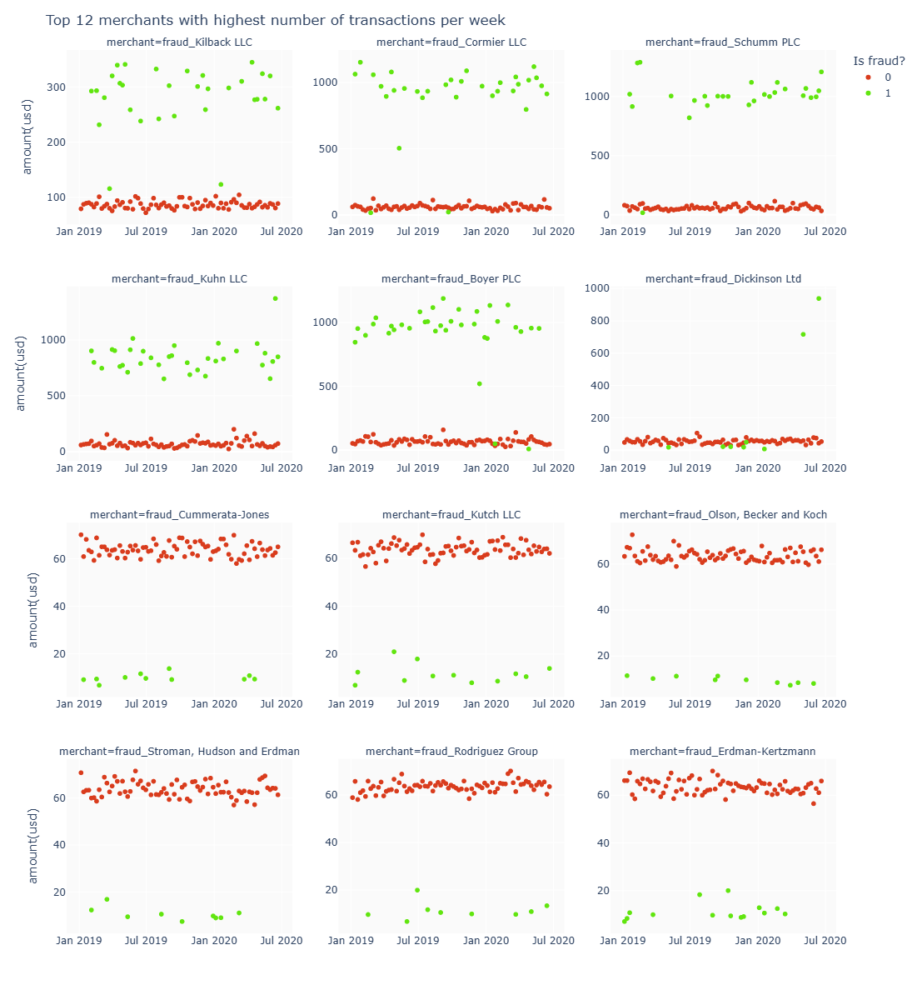

In [23]:
fig = px.scatter(df_,
        x='transaction_time',
        y='amount(usd)',
        color='is_fraud',
        facet_col ='merchant',
        facet_col_wrap=3,
        facet_col_spacing=.06,
        category_orders={'merchant': top12_merchants.index}, # order the subplots
        color_discrete_map={1:'#61E50F', 0:'#D93C1D'}
)

fig.update_layout(height=1200,
                  width=960,
                  title='Top 12 merchants with highest number of transactions per week',
                  legend=dict(title='Is fraud?'),
                  plot_bgcolor='#fafafa'
                 )

fig.update_yaxes(matches=None)
fig.for_each_yaxis(lambda yaxis: yaxis.update(showticklabels=True))
fig.for_each_xaxis(lambda xaxis: xaxis.update(showticklabels=True, title=''))

fig.show();

2. Which jobs has most fraud transactions?

In [24]:
groups = ['is_fraud','job']
df_ = df_train.groupby(by=groups).agg({"amount(usd)":'mean',"transaction_id":"count"}).fillna(0).reset_index()

# Top 10 jobs had most fraud transactions.
df_ = df_[df_.is_fraud==1].sort_values(by='transaction_id',
                                       ascending=False).drop_duplicates('job', keep='first').iloc[:10, :]
df_

C:\Users\fahad\AppData\Local\Temp\ipykernel_21760\3075285976.py:2: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,is_fraud,job,amount(usd),transaction_id
780,1,Materials engineer,561.092097,62
971,1,Trading standards officer,478.137143,56
802,1,Naval architect,653.563962,53
681,1,Exhibition designer,524.067255,51
933,1,"Surveyor, land/geomatics",510.914800,50
781,1,Mechanical engineer,531.585714,49
845,1,Prison officer,453.897500,48
875,1,Quantity surveyor,591.754167,48
536,1,Audiological scientist,660.311739,46
604,1,"Copywriter, advertising",458.743556,45


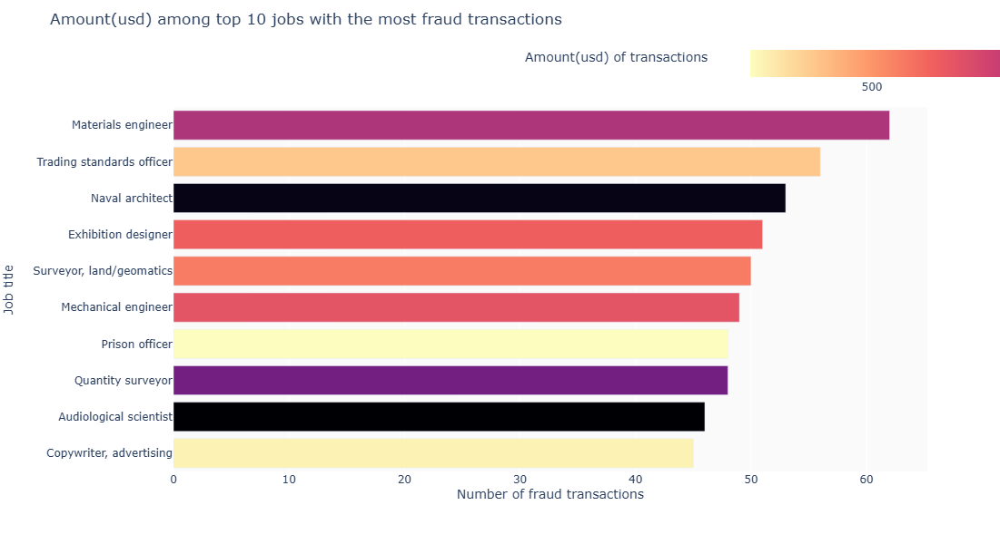

In [25]:
fig = px.bar(df_,
             y='job', x='transaction_id',
             color='amount(usd)',
             color_continuous_scale=px.colors.sequential.Magma,
             labels={'job':'Job title', 
                     'transaction_id': 'Number of fraud transactions'},
             category_orders = {"job": df_.job.values},
             width=960,
             height=600)

fig.update_layout(
    title=dict(
        text='Amount(usd) among top 10 jobs with the most fraud transactions'
    ),
    plot_bgcolor='#fafafa'
)

fig.update_coloraxes(
    colorbar=dict(
        title='Amount(usd) of transactions',
        orientation='h',
        x=1
    ),
    reversescale=True
)

fig.show()

Which credit card number/ credit card holder has most fraud transaction?

In [26]:
groups = ['credit_card_number']
df_ = df_train.groupby(by=groups).agg({"amount(usd)":'mean',"transaction_id":"count"}).fillna(0).reset_index()
df_.sort_values('transaction_id', ascending=False, inplace=True)
df_ = df_.head(10)

C:\Users\fahad\AppData\Local\Temp\ipykernel_21760\2917306963.py:2: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



C:\Users\fahad\AppData\Local\Temp\ipykernel_21760\1189557049.py:1: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



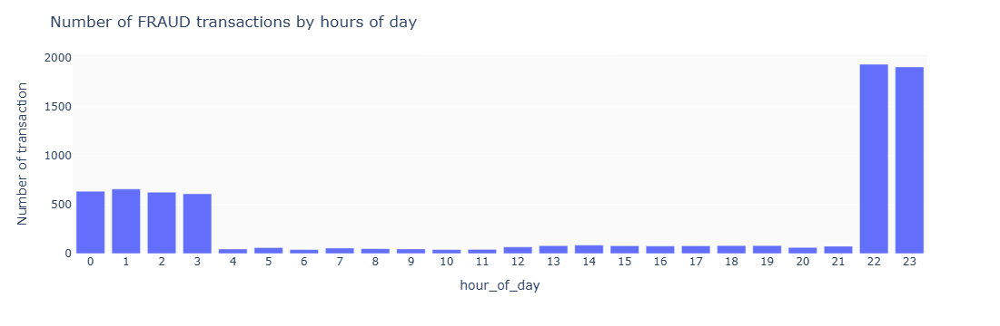

In [27]:
df_ = df_train[df_train.is_fraud==1].groupby(by='hour_of_day').agg({'transaction_id':'count'}).reset_index()

fig = px.bar(data_frame=df_,
       x='hour_of_day',
       y='transaction_id',
       labels={'transaction_id':'Number of transaction'})

fig.update_layout(
    title=dict(
        text='Number of FRAUD transactions by hours of day'
    ),
    plot_bgcolor='#fafafa'
)

fig.update_xaxes(type='category')

In [28]:
df_train.dtypes

transaction_time      datetime64[ns]
credit_card_number          category
merchant                      object
category                      object
amount(usd)                  float64
first                         object
last                          object
gender                        object
street                        object
city                          object
state                         object
zip                            int64
lat                          float64
long                         float64
city_pop                       int64
job                           object
dob                   datetime64[ns]
transaction_id                object
unix_time                      int64
merch_lat                    float64
merch_long                   float64
is_fraud                    category
time                  datetime64[ns]
hour_of_day                 category
dtype: object

Next, build the model to predict Fraud Transactions(label "1")   
Target: The higher **F1-Score** for label 1, the better the model!

## 3 Modelling

#### 3.1 preparing the dataset for test and train split

In [102]:
features = ['transaction_id', 'hour_of_day', 'category', 'amount(usd)', 'merchant', 'job']

#
X = df_train[features].set_index("transaction_id")
y = df_train['is_fraud']

print('X shape:{}\ny shape:{}'.format(X.shape,y.shape))

X shape:(1296675, 5)
y shape:(1296675,)


#### 3.2 Selecting features

In [103]:
from sklearn.preprocessing import OrdinalEncoder

enc = OrdinalEncoder(dtype=np.int64)
enc.fit(X.loc[:,['category','merchant','job']])

X.loc[:, ['category','merchant','job']] = enc.transform(X[['category','merchant','job']])

In [104]:
#X[['category','merchant','job']]

In [105]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2

def select_features(X_train, y_train, X_test):
    fs = SelectKBest(score_func=chi2, k='all')
    fs.fit(X_train, y_train)
    X_train_fs = fs.transform(X_train)
    X_test_fs = fs.transform(X_test)
    return X_train_fs, X_test_fs, fs

In [106]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y)
print('X_train shape:{}\ny_train shape:{}'.format(X_train.shape,y_train.shape))
print('X_test shape:{}\ny_test shape:{}'.format(X_test.shape,y_test.shape))

X_train shape:(1037340, 5)
y_train shape:(1037340,)
X_test shape:(259335, 5)
y_test shape:(259335,)


#### 3.3 Decision Tree Classifier

In [107]:
from sklearn.tree import DecisionTreeClassifier

dcstree = DecisionTreeClassifier(random_state=42)
dcstree.fit(X_train, y_train)

y_pred = dcstree.predict(X_test)

<Axes: >

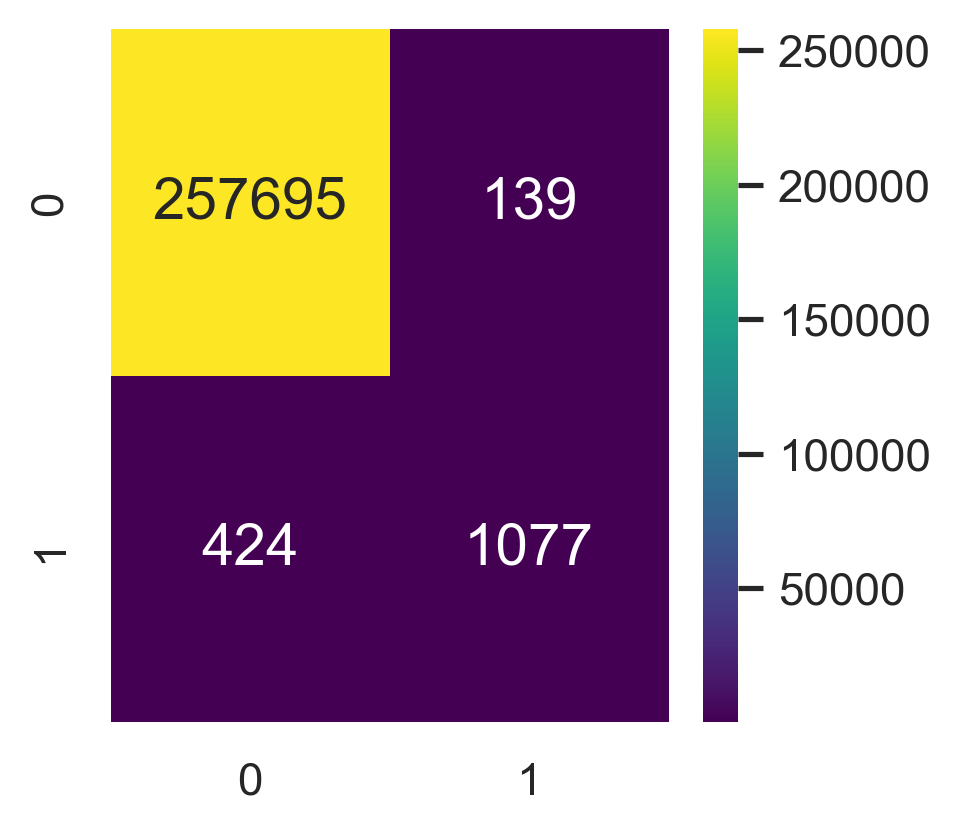

In [129]:
fig = plt.figure(figsize=(3,3))
cfs_matrix = confusion_matrix(y_test, y_pred)
sns.heatmap(cfs_matrix, cmap='viridis', annot=True, fmt='d', annot_kws=dict(fontsize=14))

In [109]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    257834
           1       0.70      0.72      0.71      1501

    accuracy                           1.00    259335
   macro avg       0.85      0.86      0.85    259335
weighted avg       1.00      1.00      1.00    259335



With DecisionTree we have F1-Score = **0.69** for label 1 

#### 3.4 Random forest using SMOTE
SMOTE (Synthetic Minority Oversampling Technique) is a resampling method used to address imbalanced datasets, particularly in binary classification problems where one class (e.g., "fraudulent") is underrepresented compared to the other (e.g., "non-fraudulent").


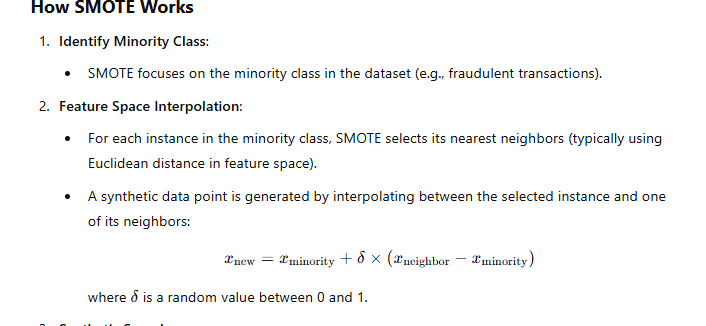

In [110]:
from imblearn.over_sampling import SMOTE
smote = SMOTE(sampling_strategy={1:48050}, random_state=42)

X_train_smote, y_train_smote = smote.fit_resample(X_train.astype('float'), y_train)
print("Before SMOTE:", Counter(y_train))
print("After SMOTE:", Counter(y_train_smote))

Before SMOTE: Counter({0: 1031335, 1: 6005})
After SMOTE: Counter({0: 1031335, 1: 48050})


In [147]:
class test_model:
    from sklearn.metrics import classification_report
    def __init__(self):
        self.metrics = ['prfs','auc','acc']

    def fit_predict(model, X_train, X_test, y_train, y_test):
        model = model
        model.fit(X_train, y_train) #Fit data to model
        y_pred = model.predict(X_test)
        return y_pred
    
    def evaluate(y_pred, metrics):
        results = {}
        for metric in metrics:
            if metric == 'prfs':
                prfs = classification_report(y_test, y_pred)
                results['prfs'] = prfs
            elif metric =='auc':
                auc_score = roc_auc_score(y_test, y_pred)
                results['auc'] = auc_score
            elif metric =='acc':
                results['acc'] = accuracy_score(y_test, y_pred)
            else:
                print('Not available metric!')
        return results

In [148]:
from sklearn.ensemble import RandomForestClassifier

# Specify your metric here
metrics = ['prfs']
print("=====================SMOTE=====================")
RDForest_eval = test_model.evaluate(y_pred=test_model.fit_predict(RandomForestClassifier(random_state=42),
                                                                  X_train_smote,
                                                                  X_test,
                                                                  y_train_smote,
                                                                  y_test
                                                                 ),
                                    metrics=metrics
                                    )

print("Random Forest model evaluate:\n", RDForest_eval['prfs'])

=====================SMOTE=====================
Random Forest model evaluate:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00    257834
           1       0.80      0.75      0.78      1501

    accuracy                           1.00    259335
   macro avg       0.90      0.87      0.89    259335
weighted avg       1.00      1.00      1.00    259335



In [161]:
y_pred=test_model.fit_predict(RandomForestClassifier(random_state=42),
                                                                  X_train_smote,
                                                                  X_test,
                                                                  y_train_smote,
                                                                  y_test
                                                                 )

<Axes: >

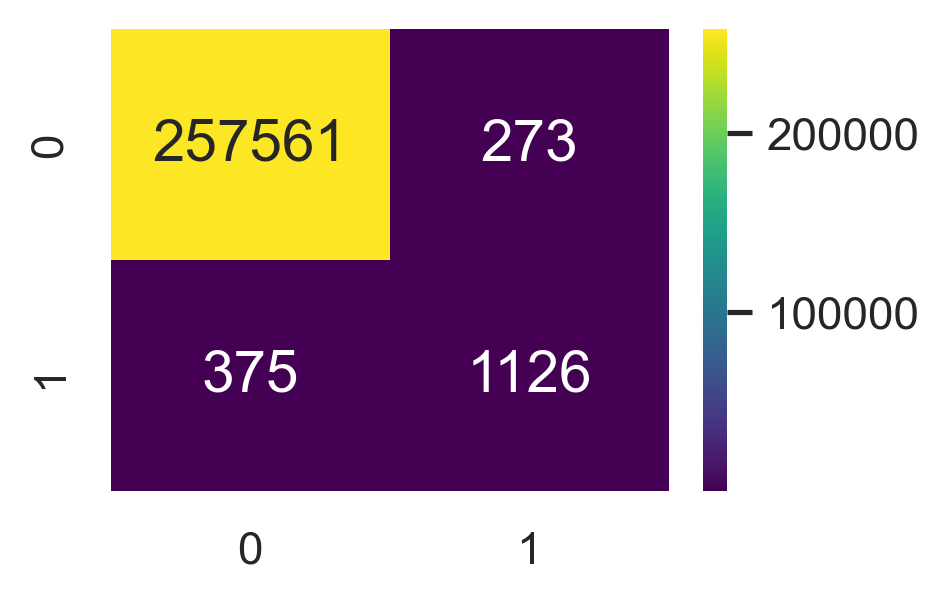

In [168]:
fig = plt.figure(figsize=(3,2))
cfs_matrix = confusion_matrix(y_test, y_pred)
sns.heatmap(cfs_matrix, cmap='viridis', annot=True, fmt='d', annot_kws=dict(fontsize=14))

With RandomForestClassifier we have better **F1-Score = 0.76** for label 1.

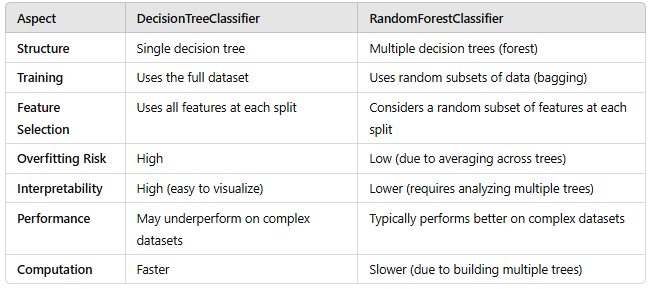

#### 3.5 Try tuning some important Hyperparameters for RDF

In [113]:
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 50, stop = 200, num = 4)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 50, num = 5)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]

# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf
              }

print(random_grid)

{'n_estimators': [50, 100, 150, 200], 'max_features': ['auto', 'sqrt'], 'max_depth': [10, 20, 30, 40, 50, None], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 4]}


In [114]:
from sklearn.metrics import f1_score, make_scorer
f1 = make_scorer(f1_score, greater_is_better=True, pos_label=1)

In [115]:
# Uncomment lines to run this code, this can be 
"""
rf = RandomForestClassifier()
rf_random = RandomizedSearchCV(estimator = rf,
                               param_distributions = random_grid,
                               n_iter = 50,
                               cv = 5,
                               verbose=2,
                               random_state=42
                              )

#Fit and show the best parameters
rf_random.fit(X_train, y_train)
print(rf_random.best_estimator_)
"""

'\nrf = RandomForestClassifier()\nrf_random = RandomizedSearchCV(estimator = rf,\n                               param_distributions = random_grid,\n                               n_iter = 50,\n                               cv = 5,\n                               verbose=2,\n                               random_state=42\n                              )\n\n#Fit and show the best parameters\nrf_random.fit(X_train, y_train)\nprint(rf_random.best_estimator_)\n'

The best estimator on randomized_search:  
RandomForestClassifier(max_features='sqrt', n_estimators=200)

In [160]:
rf_random = RandomForestClassifier(max_features='sqrt',
                                   n_estimators=200,
                                   random_state=41
                                   )

rf_random.fit(X_train, y_train)
y_pred = rf_random.predict(X_test)

# Print reprort
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    257834
           1       0.89      0.72      0.79      1501

    accuracy                           1.00    259335
   macro avg       0.94      0.86      0.90    259335
weighted avg       1.00      1.00      1.00    259335



In [117]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
Index: 555719 entries, 2da90c7d74bd46a0caf3777415b3ebd3 to 1765bb45b3aa3224b4cdcb6e7a96cee3
Data columns (total 7 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   hour_of_day    555719 non-null  int32  
 1   category       555719 non-null  object 
 2   amount(usd)    555719 non-null  float64
 3   merchant       555719 non-null  object 
 4   job            555719 non-null  object 
 5   Fraud_Proba    555719 non-null  float64
 6   Fraud_Predict  555719 non-null  int64  
dtypes: float64(2), int32(1), int64(1), object(3)
memory usage: 47.9+ MB


After tuning, we have **F1-Score = 0.8** for label 1, atually good :)

In [131]:
df_test = df_test.rename(columns={"trans_date_trans_time":"transaction_time",
                         "cc_num":"credit_card_number",
                         "amt":"amount(usd)",
                         "trans_num":"transaction_id"}
                        )


In [132]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 555719 entries, 0 to 555718
Data columns (total 22 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   transaction_time    555719 non-null  object 
 1   credit_card_number  555719 non-null  int64  
 2   merchant            555719 non-null  object 
 3   category            555719 non-null  object 
 4   amount(usd)         555719 non-null  float64
 5   first               555719 non-null  object 
 6   last                555719 non-null  object 
 7   gender              555719 non-null  object 
 8   street              555719 non-null  object 
 9   city                555719 non-null  object 
 10  state               555719 non-null  object 
 11  zip                 555719 non-null  int64  
 12  lat                 555719 non-null  float64
 13  long                555719 non-null  float64
 14  city_pop            555719 non-null  int64  
 15  job                 555719 non-nul

In [133]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 555719 entries, 0 to 555718
Data columns (total 22 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   transaction_time    555719 non-null  object 
 1   credit_card_number  555719 non-null  int64  
 2   merchant            555719 non-null  object 
 3   category            555719 non-null  object 
 4   amount(usd)         555719 non-null  float64
 5   first               555719 non-null  object 
 6   last                555719 non-null  object 
 7   gender              555719 non-null  object 
 8   street              555719 non-null  object 
 9   city                555719 non-null  object 
 10  state               555719 non-null  object 
 11  zip                 555719 non-null  int64  
 12  lat                 555719 non-null  float64
 13  long                555719 non-null  float64
 14  city_pop            555719 non-null  int64  
 15  job                 555719 non-nul

In [134]:
# Apply function utcfromtimestamp and drop column unix_time
df_test['time'] = df_test['unix_time'].apply(datetime.utcfromtimestamp)

# Add cloumn hour of day
df_test['hour_of_day'] = df_test.time.dt.hour

df_test = df_test[features].set_index("transaction_id")
enc = OrdinalEncoder(dtype=np.int64)
enc.fit(df_test.loc[:, ['category','merchant','job']])

df_test.loc[:, ['category','merchant','job']] = enc.transform(df_test[['category','merchant','job']])

In [135]:
y_pred  = rf_random.predict(df_test)
y_proba = rf_random.predict_proba(df_test)[:, 1]

In [136]:
df_test["Fraud_Proba"] = y_proba
df_test["Fraud_Predict"] = y_pred

In [170]:
result = df_test[["Fraud_Proba", "Fraud_Predict"]]
# Store result in a CSV file 
result.to_csv(r"./PredictFraud_Results.csv")